In [1]:
import numpy as np
import pandas as pd
import os
import math
import matplotlib.pyplot as plt
import re
from random import randint, seed
from IPython.display import display
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.preprocessing import StandardScaler, OrdinalEncoder, LabelEncoder
from sklearn.metrics import accuracy_score, confusion_matrix, r2_score, mean_squared_error
import warnings
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression
from sklearn.decomposition import PCA
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report
pd.set_option('display.max_columns', None)
import plotly.express as px

# Import du dataset

In [2]:
path = 'maladie_cardiaque.csv'
maladie = pd.read_csv(path,sep=',',header=0, index_col=1)
maladie = maladie.drop(columns=['Unnamed: 0'])
maladie.head(5)

,age,genre,taille,Poids,pression_systo,pression_diasto,cholesterol,glycemie,fumeur,conso_alco,activite_physique,malade
id,,,,,,,,,,,,
0,18393,homme,168,62.0,110,80,normal,1,non fumeur,non,1,non
1,20228,femme,156,85.0,140,90,tres eleve,1,non fumeur,non,1,oui
2,18857,femme,165,64.0,130,70,tres eleve,1,non fumeur,non,0,oui
3,17623,homme,169,82.0,150,100,normal,1,non fumeur,non,1,oui
4,17474,femme,156,56.0,100,60,normal,1,non fumeur,non,0,non


# Analyse superficielle du dataset

In [3]:
from data_analyzer import analyse

resultat = analyse(maladie)
display(resultat)

(70000, 12)

,Name,dtypes,Missing,Miss_Percent,Unique,First Value,Second Value,Third Value
0,age,int64,0,0.0,8076,18393,20228,18857
1,genre,object,0,0.0,2,homme,femme,femme
2,taille,int64,0,0.0,109,168,156,165
3,Poids,float64,0,0.0,287,62.0,85.0,64.0
4,pression_systo,int64,0,0.0,153,110,140,130
5,pression_diasto,int64,0,0.0,157,80,90,70
6,cholesterol,object,0,0.0,3,normal,tres eleve,tres eleve
7,glycemie,int64,0,0.0,3,1,1,1
8,fumeur,object,0,0.0,2,non fumeur,non fumeur,non fumeur
9,conso_alco,object,0,0.0,2,non,non,non


In [4]:
maladie.describe()

,age,taille,Poids,pression_systo,pression_diasto,glycemie,activite_physique
count,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000,70000.000000
mean,19468.865814,164.359229,74.205690,128.817286,96.630414,1.226457,0.803729
std,2467.251667,8.210126,14.395757,154.011419,188.472530,0.572270,0.397179
min,10798.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,0.000000
25%,17664.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000
50%,19703.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000
75%,21327.000000,170.000000,82.000000,140.000000,90.000000,1.000000,1.000000
max,23713.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,1.000000


# Data Prep

Création d'une colonne pour avoir l'âge en année

In [5]:
maladie["Age(year)"] = maladie["age"]/365

Ajout d'une colonne avec l'IMC des individus

In [6]:
maladie["IMC"] = maladie['Poids']/((maladie['taille']/100)*(maladie['taille']/100))
maladie

,age,genre,taille,Poids,pression_systo,pression_diasto,cholesterol,glycemie,fumeur,conso_alco,activite_physique,malade,Age(year),IMC
id,,,,,,,,,,,,,,
0,18393,homme,168,62.0,110,80,normal,1,non fumeur,non,1,non,50.391781,21.967120
1,20228,femme,156,85.0,140,90,tres eleve,1,non fumeur,non,1,oui,55.419178,34.927679
2,18857,femme,165,64.0,130,70,tres eleve,1,non fumeur,non,0,oui,51.663014,23.507805
3,17623,homme,169,82.0,150,100,normal,1,non fumeur,non,1,oui,48.282192,28.710479
4,17474,femme,156,56.0,100,60,normal,1,non fumeur,non,0,non,47.873973,23.011177
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99993,19240,homme,168,76.0,120,80,normal,1,fumeur,non,1,non,52.712329,26.927438
99995,22601,femme,158,126.0,140,90,eleve,2,non fumeur,non,1,oui,61.920548,50.472681
99996,19066,homme,183,105.0,180,90,tres eleve,1,non fumeur,oui,0,oui,52.235616,31.353579


Caractérisation de l'IMC

In [7]:
maladie.drop_duplicates(inplace=True)
labels = ['Sous-poids', 'Normal', 'Surpoids', 'Obèse']
maladie['IMC_Categorie'] = pd.cut(maladie['IMC'], bins=[0, 18.5, 25, 30, float('inf')], labels=labels, include_lowest=True)


Séparation des individus en tranche d'âge

In [8]:
bins = [0, 18, 35, 50, 70, float('inf')]
labels = ['0-18', '19-35', '36-50', '51-70', '70+']
maladie['Age_Categorie'] = pd.cut(maladie['Age(year)'], bins=bins, labels=labels, include_lowest=True)

In [9]:
maladie['Ratio_Poids_Taille'] = maladie['Poids'] / (maladie['taille'] / 100)

In [10]:
conditions = [
    (maladie['pression_systo'] < 90) & (maladie['pression_diasto'] < 60),  # Hypotension
    (maladie['pression_systo'] >= 90) & (maladie['pression_systo'] < 115) & (maladie['pression_diasto'] < 75),  # Hypotension légère
    (maladie['pression_systo'] >= 115) & (maladie['pression_systo'] < 120) & (maladie['pression_diasto'] < 80),  # Normale
    (maladie['pression_systo'] >= 120) & (maladie['pression_systo'] < 140) & (maladie['pression_diasto'] < 90),  # Hypertension légère
    (maladie['pression_systo'] >= 140) | (maladie['pression_diasto'] >= 90)  # Hypertension
]
labels = ['Hypotension', 'Hypotension Légère', 'Normale', 'Hypertension Légère', 'Hypertension']
maladie['Pression_Arterielle_Categorie'] = np.select(conditions, labels, default='Inconnu')

In [11]:
maladie.head()

,age,genre,taille,Poids,pression_systo,pression_diasto,cholesterol,glycemie,fumeur,conso_alco,activite_physique,malade,Age(year),IMC,IMC_Categorie,Age_Categorie,Ratio_Poids_Taille,Pression_Arterielle_Categorie
id,,,,,,,,,,,,,,,,,,
0,18393,homme,168,62.0,110,80,normal,1,non fumeur,non,1,non,50.391781,21.967120,Normal,51-70,36.904762,Inconnu
1,20228,femme,156,85.0,140,90,tres eleve,1,non fumeur,non,1,oui,55.419178,34.927679,Obèse,51-70,54.487179,Hypertension
2,18857,femme,165,64.0,130,70,tres eleve,1,non fumeur,non,0,oui,51.663014,23.507805,Normal,51-70,38.787879,Hypertension Légère
3,17623,homme,169,82.0,150,100,normal,1,non fumeur,non,1,oui,48.282192,28.710479,Surpoids,36-50,48.520710,Hypertension
4,17474,femme,156,56.0,100,60,normal,1,non fumeur,non,0,non,47.873973,23.011177,Normal,36-50,35.897436,Hypotension Légère


Détéctions des outliners

C:\Users\himme\AppData\Local\Temp\ipykernel_11228\2417649260.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=60)


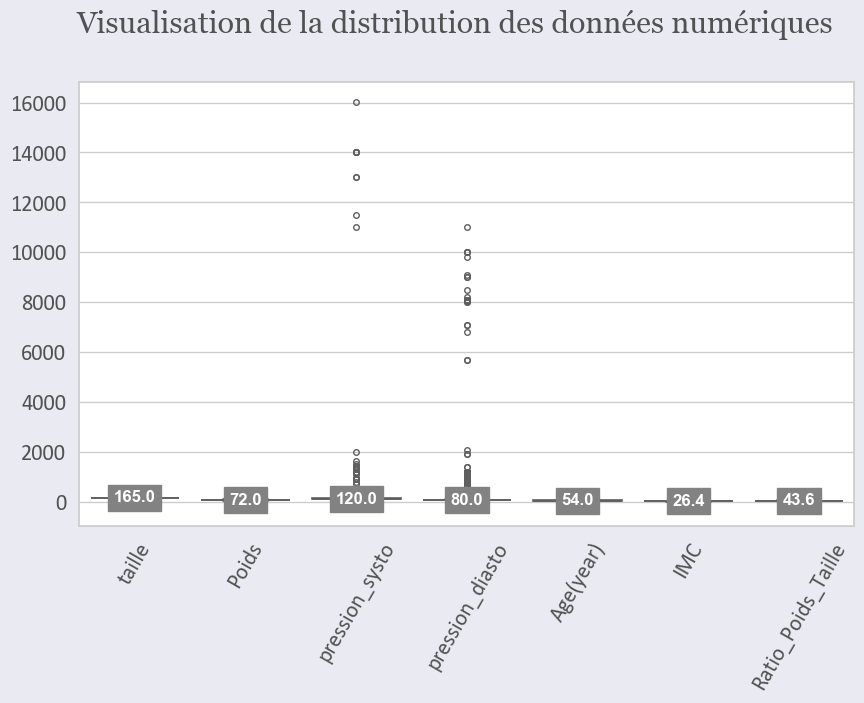

In [12]:
# Boxplot des outliners

var_num = ['taille', 'Poids', 'pression_systo', 'pression_diasto', "Age(year)", 'IMC', "Ratio_Poids_Taille"]
maladie[var_num] = maladie[var_num].apply(pd.to_numeric, errors='coerce', axis=1)

sns.set(style='whitegrid')
facecolor = '#eaeaf2'
fig, ax = plt.subplots(figsize=(10, 6), facecolor=facecolor)

x = sns.boxplot(data=maladie,
                       palette='Set3',
                       linewidth=1.2,
                       fliersize=2,
                       order=['taille', 'Poids', 'pression_systo', 'pression_diasto', "Age(year)",'IMC', "Ratio_Poids_Taille"],
                       flierprops=dict(marker='o', markersize=4))

font_color = '#525252'
csfont = {'fontname':'Georgia'}
hfont = {'fontname':'Calibri'}

for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set(fontsize=16, color=font_color, **hfont)

title = 'Visualisation de la distribution des données numériques'
fig.suptitle(title, y=.97, fontsize=22, color=font_color, **csfont)
plt.subplots_adjust(top=0.85)

for i, box in enumerate(ax.artists):
         col = box.get_facecolor()
         plt.setp(ax.lines[i*6+5], mfc=col, mec=col)

lines = ax.get_lines()
categories = ax.get_xticks()

for cat in categories:
    y = round(lines[4+cat*6].get_ydata()[0],1)
    ax.text(
        cat,
        y,
        f'{y}',
        ha='center',
        va='center',
        fontweight='semibold',
        size=12,
        color='white',
        bbox=dict(facecolor='#828282', edgecolor='#828282')
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

plt.show()

In [13]:
maladie["IMC"].mean()

27.557610036546496

Suppression des outliers

In [14]:
out_filter = ((maladie["pression_systo"]>250) | (maladie["pression_diasto"]>200))
maladie = maladie[~out_filter]
out_filter2 = ((maladie["pression_systo"] < 0) | (maladie["pression_diasto"] < 0))
maladie = maladie[~out_filter2]
out_filter3 = ((maladie["taille"] > 200))
maladie = maladie[~out_filter3]
out_filter4 = ((maladie["IMC"] > 200))
maladie = maladie[~out_filter4]

C:\Users\himme\AppData\Local\Temp\ipykernel_11228\2417649260.py:49: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=60)


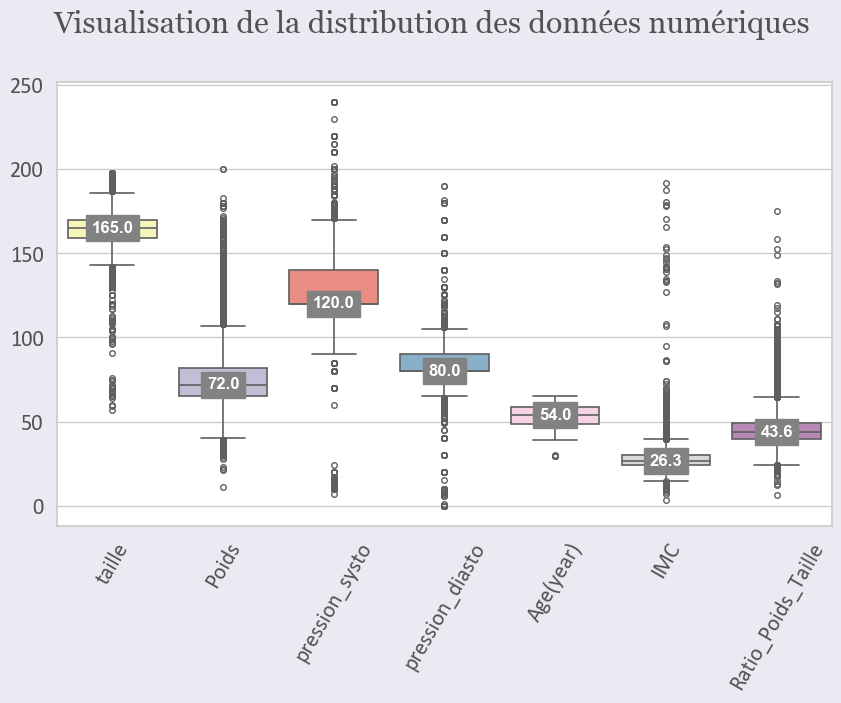

In [15]:
# Boxplot des outliners

var_num = ['taille', 'Poids', 'pression_systo', 'pression_diasto', "Age(year)", 'IMC', "Ratio_Poids_Taille"]
maladie[var_num] = maladie[var_num].apply(pd.to_numeric, errors='coerce', axis=1)

sns.set(style='whitegrid')
facecolor = '#eaeaf2'
fig, ax = plt.subplots(figsize=(10, 6), facecolor=facecolor)

x = sns.boxplot(data=maladie,
                       palette='Set3',
                       linewidth=1.2,
                       fliersize=2,
                       order=['taille', 'Poids', 'pression_systo', 'pression_diasto', "Age(year)",'IMC', "Ratio_Poids_Taille"],
                       flierprops=dict(marker='o', markersize=4))

font_color = '#525252'
csfont = {'fontname':'Georgia'}
hfont = {'fontname':'Calibri'}

for label in (ax.get_xticklabels() + ax.get_yticklabels()):
    label.set(fontsize=16, color=font_color, **hfont)

title = 'Visualisation de la distribution des données numériques'
fig.suptitle(title, y=.97, fontsize=22, color=font_color, **csfont)
plt.subplots_adjust(top=0.85)

for i, box in enumerate(ax.artists):
         col = box.get_facecolor()
         plt.setp(ax.lines[i*6+5], mfc=col, mec=col)

lines = ax.get_lines()
categories = ax.get_xticks()

for cat in categories:
    y = round(lines[4+cat*6].get_ydata()[0],1)
    ax.text(
        cat,
        y,
        f'{y}',
        ha='center',
        va='center',
        fontweight='semibold',
        size=12,
        color='white',
        bbox=dict(facecolor='#828282', edgecolor='#828282')
)

ax.set_xticklabels(ax.get_xticklabels(), rotation=60)

plt.show()

In [16]:
maladie.shape

(68969, 18)

In [17]:
maladie.head()

,age,genre,taille,Poids,pression_systo,pression_diasto,cholesterol,glycemie,fumeur,conso_alco,activite_physique,malade,Age(year),IMC,IMC_Categorie,Age_Categorie,Ratio_Poids_Taille,Pression_Arterielle_Categorie
id,,,,,,,,,,,,,,,,,,
0,18393,homme,168.0,62.0,110.0,80.0,normal,1,non fumeur,non,1,non,50.391781,21.967120,Normal,51-70,36.904762,Inconnu
1,20228,femme,156.0,85.0,140.0,90.0,tres eleve,1,non fumeur,non,1,oui,55.419178,34.927679,Obèse,51-70,54.487179,Hypertension
2,18857,femme,165.0,64.0,130.0,70.0,tres eleve,1,non fumeur,non,0,oui,51.663014,23.507805,Normal,51-70,38.787879,Hypertension Légère
3,17623,homme,169.0,82.0,150.0,100.0,normal,1,non fumeur,non,1,oui,48.282192,28.710479,Surpoids,36-50,48.520710,Hypertension
4,17474,femme,156.0,56.0,100.0,60.0,normal,1,non fumeur,non,0,non,47.873973,23.011177,Normal,36-50,35.897436,Hypotension Légère


# DataViz

Distribution des maladies cardiaques ou non

C:\Users\himme\AppData\Local\Temp\ipykernel_11228\210185891.py:7: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(x='malade', data=maladie, ax=ax2, palette=palette)


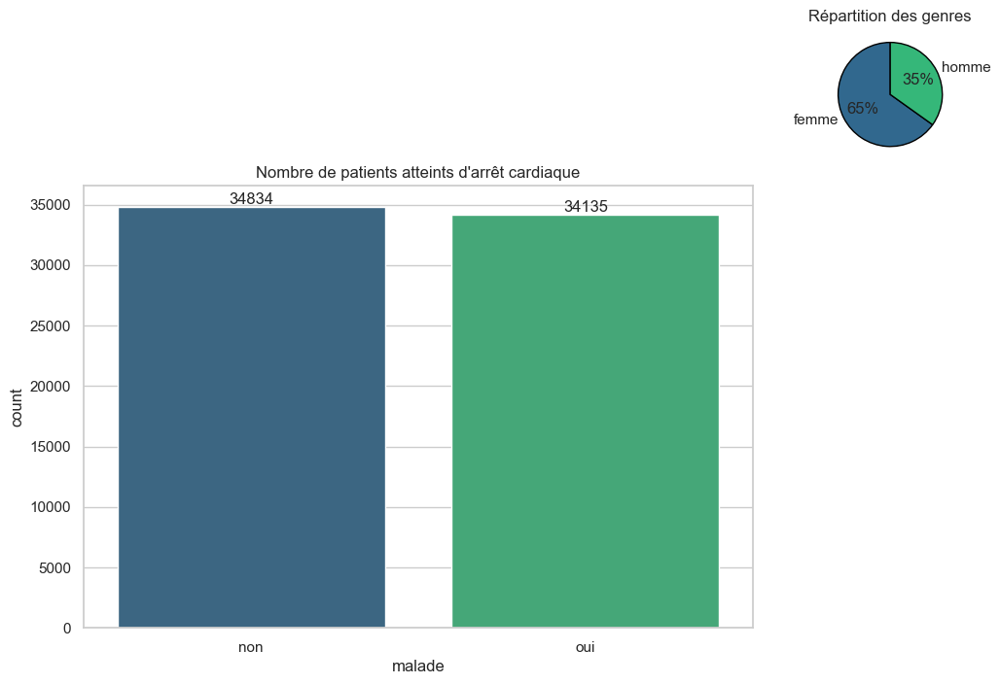

In [18]:
plt.figure(figsize=(12, 8))
gs = plt.GridSpec(4, 4)

# Tracé du graphique principal (histogramme)
ax2 = plt.subplot(gs[1:, :-1])
palette = sns.color_palette("viridis", 2)
sns.countplot(x='malade', data=maladie, ax=ax2, palette=palette)
for i, j in enumerate(maladie['malade'].value_counts().values):
    ax2.text(i, j, str(j), ha='center', va='bottom', fontsize=12)
ax2.set(title="Nombre de patients atteints d'arrêt cardiaque")


# Tracé du diagramme circulaire (en petit)
ax1 = plt.subplot(gs[0, -1])

sizes = maladie['genre'].value_counts().values
ax1.pie(sizes, labels=maladie['genre'].value_counts().index, autopct="%1.0f%%", startangle=90, colors=palette, wedgeprops={'edgecolor': 'black'})
ax1.set_title("Répartition des genres")

plt.show()

Distribution de l'âge

In [19]:
# Création de l'histogramme
fig = px.histogram(maladie, x="Age(year)", nbins=30, title="Distribution de l'âge")

# Ajustements esthétiques
fig.update_traces(marker_color='skyblue', marker_line_color='black', marker_line_width=1, opacity=0.7)

# Ajustements de la mise en page
fig.update_layout(xaxis_title="Age(year)", yaxis_title="Nombre", showlegend=False,
                  bargap=0.05, plot_bgcolor='rgba(0,0,0,0)', margin=dict(l=50, r=50, t=50, b=50))

# Affichage du graphique
fig.show()

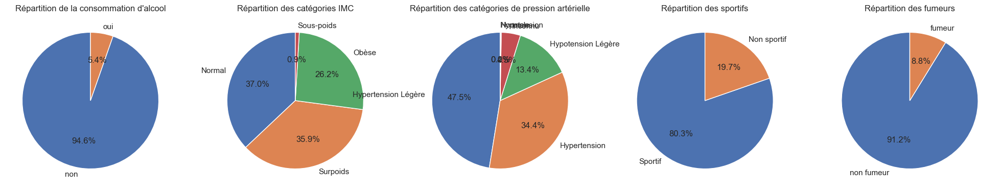

In [20]:
# Comptage des occurrences pour chaque catégorie
conso_alco_counts = maladie['conso_alco'].value_counts()
IMC_counts = maladie['IMC_Categorie'].value_counts()
pression_arterielle_counts = maladie['Pression_Arterielle_Categorie'].value_counts()
sportif_counts = maladie['activite_physique'].value_counts()
fumeur_counts = maladie['fumeur'].value_counts()

# Remplacement des étiquettes pour le graphique des sportifs
sportif_labels = {0: 'Non sportif', 1: 'Sportif'}

# Création d'une figure avec cinq sous-graphiques
fig, axes = plt.subplots(1, 5, figsize=(25, 5))

# Graphique pour la répartition de ceux qui consomment de l'alcool ou non
axes[0].pie(conso_alco_counts, labels=maladie['conso_alco'].value_counts().index, autopct='%1.1f%%', startangle=90)
axes[0].set_title('Répartition de la consommation d\'alcool')

# Graphique pour la répartition des catégories IMC
axes[1].pie(IMC_counts, labels=maladie['IMC_Categorie'].value_counts().index, autopct='%1.1f%%', startangle=90)
axes[1].set_title('Répartition des catégories IMC')

# Graphique pour la répartition des catégories de pression artérielle
axes[2].pie(pression_arterielle_counts, labels=maladie['Pression_Arterielle_Categorie'].value_counts().index, autopct='%1.1f%%', startangle=90)
axes[2].set_title('Répartition des catégories de pression artérielle')

# Graphique pour la répartition des sportifs
axes[3].pie(sportif_counts, labels=[sportif_labels[label] for label in maladie['activite_physique'].value_counts().index], autopct='%1.1f%%', startangle=90)
axes[3].set_title('Répartition des sportifs')

# Graphique pour la répartition des fumeurs
axes[4].pie(fumeur_counts, labels=maladie['fumeur'].value_counts().index, autopct='%1.1f%%', startangle=90)
axes[4].set_title('Répartition des fumeurs')

plt.show()


C:\Users\himme\AppData\Local\Temp\ipykernel_11228\3290100143.py:23: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



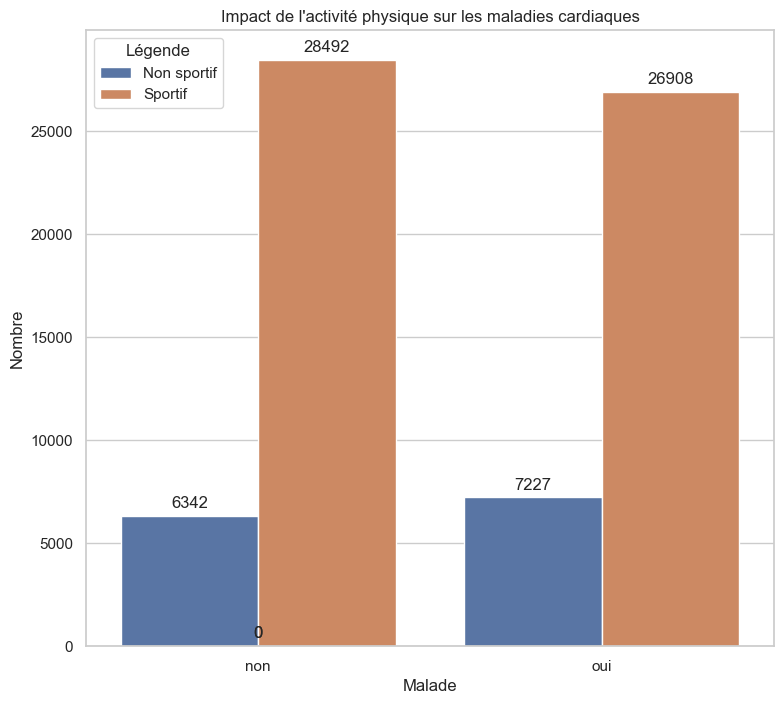

In [21]:
plt.figure(figsize=(12, 8))
gs = plt.GridSpec(4, 4)

ax = plt.subplot(gs[:, :-1])  # Sélection de la région pour le graphique principal
sns.countplot(x='malade', hue='activite_physique', data=maladie, ax=ax)

plt.title("Impact de l'activité physique sur les maladies cardiaques")
plt.xlabel("Malade")
plt.ylabel("Nombre")

# Ajout des étiquettes de données
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', 
                xytext=(0, 9), 
                textcoords='offset points')

# Mettre à jour la légende avec les étiquettes modifiées des données d'activité physique
ax.legend(title='Légende', labels=['Non sportif', 'Sportif'])

# Mettre à jour l'axe x avec les valeurs uniques de l'état de santé
ax.set_xticklabels(maladie['malade'].unique())

plt.show()

C:\Users\himme\AppData\Local\Temp\ipykernel_11228\3851727391.py:14: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



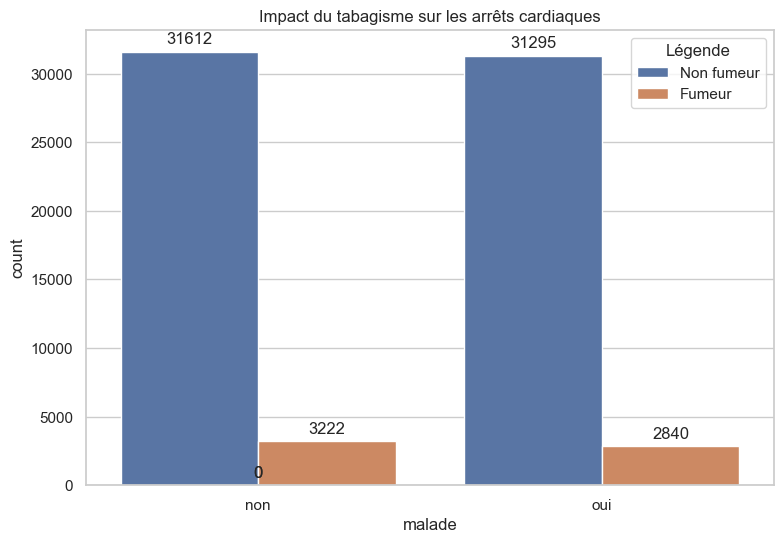

In [22]:
plt.figure(figsize=(12, 8))
gs = plt.GridSpec(4, 4)

# Tracé du graphique principal (histogramme)
ax = plt.subplot(gs[1:, :-1])
sns.countplot(x='malade', hue='fumeur', data=maladie, ax=ax)
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'), 
                 (p.get_x() + p.get_width() / 2., p.get_height()), 
                 ha='center', va='center', 
                 xytext=(0, 9), 
                 textcoords='offset points')
ax.set(title="Impact du tabagisme sur les arrêts cardiaques")
ax.set_xticklabels(maladie['malade'].unique())  # Modification ici

# Légende pour le graphique principal
ax.legend(title='Légende', labels=['Non fumeur', 'Fumeur'])

plt.show()


In [23]:
dimensions = ["pression_systo", "pression_diasto"]
fig = px.box(maladie, y=dimensions, color="malade")

# Mise à jour des titres
fig.update_layout(title='Boîtes à moustaches des variables en fonction de la variable "malade"')
fig.update_yaxes(title_text='Valeurs')

fig.show()

In [24]:
# Création de l'histogramme avec deux courbes distinctes
fig = px.histogram(maladie, x="Age(year)", color="malade", nbins=30, title="Distribution de l'âge des malades et non malade",
                   facet_col="malade")

# Ajustements esthétiques
fig.update_traces(opacity=0.7)

# Ajustements de la mise en page
fig.update_layout(xaxis_title="Âge (années)", yaxis_title="Nombre", bargap=0.05, showlegend=False,
                  plot_bgcolor='rgba(0,0,0,0)', margin=dict(l=50, r=50, t=50, b=50))

# Affichage du graphique
fig.show()


In [25]:
dimensions = ["cholesterol"]

# Création de l'histogramme
fig = px.histogram(maladie, x=dimensions, color="malade", barmode='group')

# Mise à jour des titres
fig.update_layout(title='Répartition du niveau de "cholesterol" pour les patients malades et non malades')
fig.update_xaxes(title_text='Valeurs')
fig.update_yaxes(title_text='Fréquence')

fig.show()

In [26]:
dimensions = ["glycemie"]

# Création de l'histogramme
fig = px.histogram(maladie, x=dimensions, color="malade", barmode='group')

# Mise à jour des titres
fig.update_layout(title='Répartition du niveau de "glycemie" pour les patients malades et non malades')
fig.update_xaxes(title_text='Valeurs')
fig.update_yaxes(title_text='Fréquence')

fig.show()

In [27]:
label_encoder_sex = LabelEncoder()
label_encoder_bin = LabelEncoder()

# Encodage binaire des données catégorielles
maladie['genre'] = label_encoder_sex.fit_transform(maladie['genre'])
maladie['conso_alco'] = label_encoder_bin.fit_transform(maladie['conso_alco'])
maladie['fumeur'] = label_encoder_bin.fit_transform(maladie['fumeur'])
maladie['malade'] = label_encoder_bin.fit_transform(maladie['malade'])

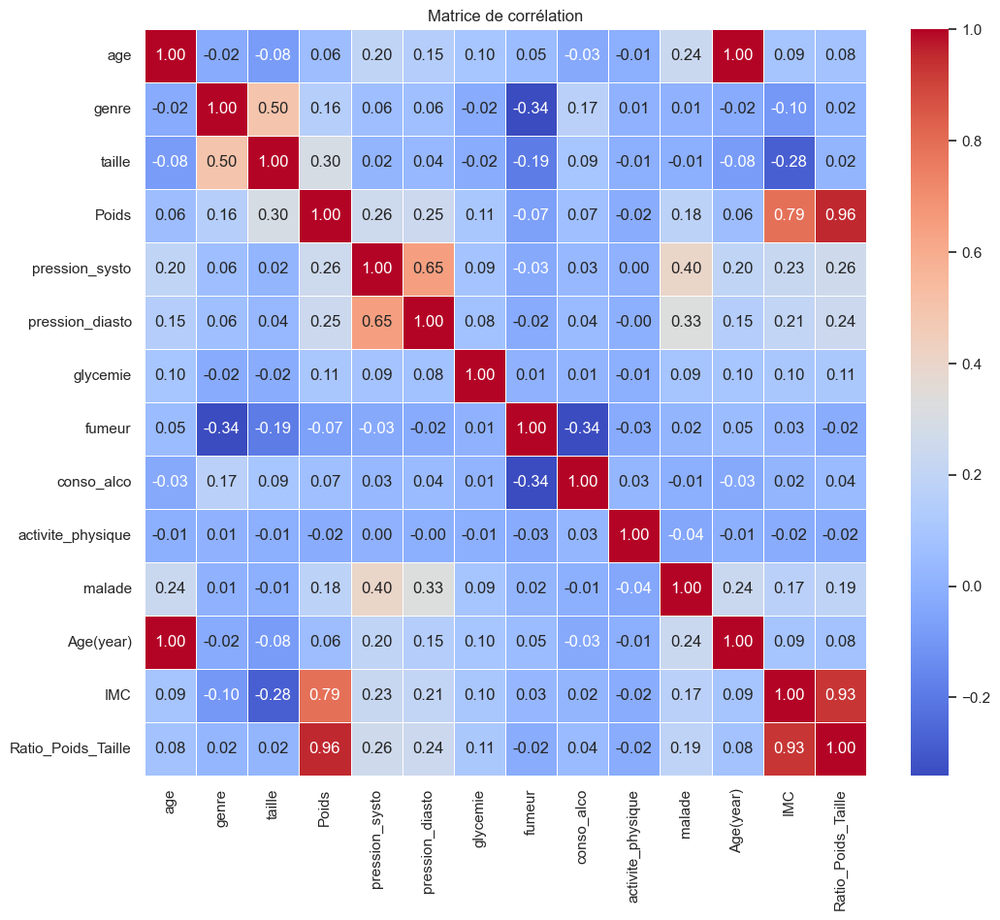

In [28]:
# Calculer la matrice de corrélation
correlation_matrix = maladie.corr()

# Visualiser la matrice de corrélation avec seaborn
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Matrice de corrélation")
plt.show()

In [29]:
# Code pour récupérer les données d'origines
# maladie['genre'] = label_encoder_sex.inverse_transform(maladie['genre'])
# display(maladie[['genre']])

In [30]:
maladie = pd.get_dummies(data = maladie, columns=['cholesterol', 'glycemie','IMC_Categorie', 'Age_Categorie', 'Pression_Arterielle_Categorie'], dtype=int)
maladie.head()

,age,genre,taille,Poids,pression_systo,pression_diasto,fumeur,conso_alco,activite_physique,malade,Age(year),IMC,Ratio_Poids_Taille,cholesterol_eleve,cholesterol_normal,cholesterol_tres eleve,glycemie_1,glycemie_2,glycemie_3,IMC_Categorie_Sous-poids,IMC_Categorie_Normal,IMC_Categorie_Surpoids,IMC_Categorie_Obèse,Age_Categorie_0-18,Age_Categorie_19-35,Age_Categorie_36-50,Age_Categorie_51-70,Age_Categorie_70+,Pression_Arterielle_Categorie_Hypertension,Pression_Arterielle_Categorie_Hypertension Légère,Pression_Arterielle_Categorie_Hypotension,Pression_Arterielle_Categorie_Hypotension Légère,Pression_Arterielle_Categorie_Inconnu,Pression_Arterielle_Categorie_Normale
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,18393,1,168.0,62.0,110.0,80.0,1,0,1,0,50.391781,21.967120,36.904762,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
1,20228,0,156.0,85.0,140.0,90.0,1,0,1,1,55.419178,34.927679,54.487179,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0
2,18857,0,165.0,64.0,130.0,70.0,1,0,0,1,51.663014,23.507805,38.787879,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0
3,17623,1,169.0,82.0,150.0,100.0,1,0,1,1,48.282192,28.710479,48.520710,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0
4,17474,0,156.0,56.0,100.0,60.0,1,0,0,0,47.873973,23.011177,35.897436,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0


# Variables d'intérêt

RFE

In [30]:
#linmodel = LinearRegression()
#rfe1 = RFE(estimator=linmodel,n_features_to_select=7,step=1,verbose=3)
#rfe1.fit(x_train,y_train)
#
#var_sel = rfe1.get_support()
#
#plt.matshow(var_sel.reshape(1,-1), cmap = 'gray_r')
#plt.xlabel('Feature selection')
#plt.yticks([]);

# Modèle IA

KNN

In [31]:
maladie.head()

,age,genre,taille,Poids,pression_systo,pression_diasto,fumeur,conso_alco,activite_physique,malade,Age(year),IMC,Ratio_Poids_Taille,cholesterol_eleve,cholesterol_normal,cholesterol_tres eleve,glycemie_1,glycemie_2,glycemie_3,IMC_Categorie_Sous-poids,IMC_Categorie_Normal,IMC_Categorie_Surpoids,IMC_Categorie_Obèse,Age_Categorie_0-18,Age_Categorie_19-35,Age_Categorie_36-50,Age_Categorie_51-70,Age_Categorie_70+,Pression_Arterielle_Categorie_Hypertension,Pression_Arterielle_Categorie_Hypertension Légère,Pression_Arterielle_Categorie_Hypotension,Pression_Arterielle_Categorie_Hypotension Légère,Pression_Arterielle_Categorie_Inconnu,Pression_Arterielle_Categorie_Normale
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,18393,1,168.0,62.0,110.0,80.0,1,0,1,0,50.391781,21.967120,36.904762,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
1,20228,0,156.0,85.0,140.0,90.0,1,0,1,1,55.419178,34.927679,54.487179,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0
2,18857,0,165.0,64.0,130.0,70.0,1,0,0,1,51.663014,23.507805,38.787879,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0
3,17623,1,169.0,82.0,150.0,100.0,1,0,1,1,48.282192,28.710479,48.520710,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0
4,17474,0,156.0,56.0,100.0,60.0,1,0,0,0,47.873973,23.011177,35.897436,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0


In [32]:
data_col = maladie[['Age(year)','taille','Poids','pression_systo','pression_diasto','activite_physique','fumeur','conso_alco','malade','genre', 'cholesterol_eleve','cholesterol_normal','cholesterol_tres eleve',	'glycemie_1',	'glycemie_2'	,'glycemie_3',	'IMC_Categorie_Sous-poids',	'IMC_Categorie_Normal',	'IMC_Categorie_Surpoids',	'IMC_Categorie_Obèse',	'Age_Categorie_0-18',	'Age_Categorie_19-35',	'Age_Categorie_36-50',	'Age_Categorie_51-70',	'Age_Categorie_70+',	'Pression_Arterielle_Categorie_Hypertension',	'Pression_Arterielle_Categorie_Hypertension Légère'	,'Pression_Arterielle_Categorie_Hypotension',	'Pression_Arterielle_Categorie_Hypotension Légère',	'Pression_Arterielle_Categorie_Inconnu',	'Pression_Arterielle_Categorie_Normale']]
data_col.head()

,Age(year),taille,Poids,pression_systo,pression_diasto,activite_physique,fumeur,conso_alco,malade,genre,cholesterol_eleve,cholesterol_normal,cholesterol_tres eleve,glycemie_1,glycemie_2,glycemie_3,IMC_Categorie_Sous-poids,IMC_Categorie_Normal,IMC_Categorie_Surpoids,IMC_Categorie_Obèse,Age_Categorie_0-18,Age_Categorie_19-35,Age_Categorie_36-50,Age_Categorie_51-70,Age_Categorie_70+,Pression_Arterielle_Categorie_Hypertension,Pression_Arterielle_Categorie_Hypertension Légère,Pression_Arterielle_Categorie_Hypotension,Pression_Arterielle_Categorie_Hypotension Légère,Pression_Arterielle_Categorie_Inconnu,Pression_Arterielle_Categorie_Normale
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,50.391781,168.0,62.0,110.0,80.0,1,1,0,0,1,0,1,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0
1,55.419178,156.0,85.0,140.0,90.0,1,1,0,1,0,0,0,1,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0
2,51.663014,165.0,64.0,130.0,70.0,0,1,0,1,0,0,0,1,1,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,0,0
3,48.282192,169.0,82.0,150.0,100.0,1,1,0,1,1,0,1,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,0,0
4,47.873973,156.0,56.0,100.0,60.0,0,1,0,0,0,0,1,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0


In [33]:
target = data_col['malade']
data = data_col.drop(['malade'],axis=1)
x_train, x_test, y_train, y_test = train_test_split(data, target, random_state = 123, test_size = 0.2)

In [34]:
sc_x = StandardScaler()
x_train = sc_x.fit_transform(x_train)
x_test = sc_x.transform(x_test)

In [35]:
math.sqrt(len(y_test))

117.44786077234443

In [36]:
param_grid = {
    'n_neighbors': [60, 80, 120],  # ajustez cette plage selon vos besoins
    'p': [1, 2],  # Norme de distance (1 pour la distance de Manhattan, 2 pour la distance euclidienne)
    'weights': ['uniform', 'distance'],
    'algorithm': ['ball_tree', 'kd_tree', 'brute']
}

# Créer un classifieur KNN
knn = KNeighborsClassifier()

# Effectuer une recherche par validation croisée
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

In [37]:
grid_search.fit(x_train[:5000], y_train[:5000])
#grid_search.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'algorithm': ['ball_tree', 'kd_tree', 'brute'],
                         'n_neighbors': [60, 80, 120], 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='accuracy')

In [38]:
# Afficher les meilleurs paramètres
print("Meilleurs paramètres:", grid_search.best_params_)
print("Meilleurs estimateurs:", grid_search.best_estimator_)

Meilleurs paramètres: {'algorithm': 'ball_tree', 'n_neighbors': 80, 'p': 1, 'weights': 'distance'}
Meilleurs estimateurs: KNeighborsClassifier(algorithm='ball_tree', n_neighbors=80, p=1,
                     weights='distance')


In [39]:
# Entraîner le modèle avec les meilleurs paramètres
best_knn = grid_search.best_estimator_
best_knn.fit(x_train, y_train)

KNeighborsClassifier(algorithm='ball_tree', n_neighbors=80, p=1,
                     weights='distance')

In [40]:
# Prédire les étiquettes de test
y_train_pred = best_knn.predict(x_train)
y_test_pred = best_knn.predict(x_test)

In [41]:
# Calculer la précision
accuracy = accuracy_score(y_train, y_train_pred)
print("Précision du modèle train avec les meilleurs paramètres:", accuracy)
accuracy = accuracy_score(y_test, y_test_pred)
print("Précision du modèle test avec les meilleurs paramètres:", accuracy)

Précision du modèle train avec les meilleurs paramètres: 0.9998006343452651
Précision du modèle test avec les meilleurs paramètres: 0.7204581702189358


In [42]:
print(classification_report(y_true=y_train, y_pred=y_train_pred))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     27898
           1       1.00      1.00      1.00     27277

    accuracy                           1.00     55175
   macro avg       1.00      1.00      1.00     55175
weighted avg       1.00      1.00      1.00     55175



In [43]:
print(classification_report(y_true=y_test, y_pred=y_test_pred))

              precision    recall  f1-score   support

           0       0.70      0.76      0.73      6936
           1       0.74      0.68      0.71      6858

    accuracy                           0.72     13794
   macro avg       0.72      0.72      0.72     13794
weighted avg       0.72      0.72      0.72     13794



In [44]:
cm = confusion_matrix(y_train,y_train_pred)
cm2 = confusion_matrix(y_test,y_test_pred)

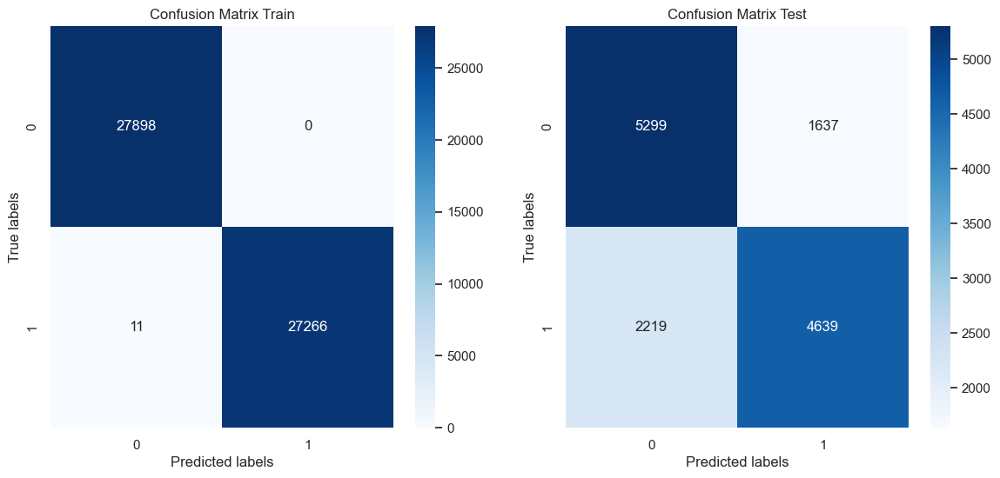

In [45]:
# Afficher la matrice de confusion sous forme de heatmap
plt.figure(figsize=(14, 6))
plt.subplot(121)
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Train')
plt.subplot(122)
sns.heatmap(cm2, annot=True, cmap='Blues', fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Test')
plt.show()

In [46]:
TN = cm2[0][0]
FP = cm2[0][1]
FN = cm2[1][0]
TP = cm2[1][1]

score = TN/(TN+FP)
display(score)

0.7639850057670127

In [47]:
x_train.shape[1]

30

In [48]:
from sklearn.model_selection import cross_val_score

# Mesurer les performances du modèle initial
initial_score = np.mean(cross_val_score(best_knn, x_train, y_train, cv=5))

# Initialiser une liste pour stocker les changements de performance
feature_importances = []

# Mesurer l'impact de chaque variable
for feature in range(x_train.shape[1]):
    X_temp = np.delete(x_train, feature, axis=1)  # Supprimer la caractéristique actuelle
    new_score = np.mean(cross_val_score(best_knn, X_temp, y_train, cv=5))
    importance = initial_score - new_score
    feature_importances.append((feature, importance))


# Trier le résultat par ordre décroissant d'importance
feature_importances.sort(key=lambda x: x[1], reverse=True)

# Afficher les importances
for feature, importance in feature_importances:
    print(f"{feature}: {importance}")

On cherche à déterminer si le patient est réellement malade. Ce qui importe ici, c'est de savoir s'il est effectivement malade et non pas s'il ne l'est pas.

SVM

In [ ]:
pca4 = PCA(n_components=0.99)
X_train_pca = pca4.fit_transform(x_train)
X_test_pca = pca4.transform(x_test)

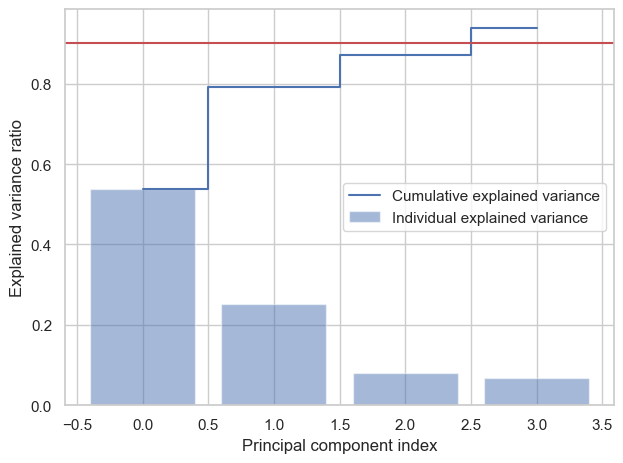

In [ ]:
pca3 = PCA(n_components=0.9)
pca3.fit_transform(x_train)
exp_var_pca3 = pca3.explained_variance_ratio_
cumulTotal = np.cumsum(exp_var_pca3)
cumulTotal
plt.bar(range(0,len(exp_var_pca3)), exp_var_pca3, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(0,len(cumulTotal)), cumulTotal, where='mid',label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.tight_layout()
plt.axhline(y=0.9, color='r', linestyle='-')
plt.show()

In [ ]:
svc1 = SVC(C=1, kernel='linear', verbose=True)
svc1.fit(X_train_pca[:100],y_train[:100])
display(svc1.score(X_test_pca,y_test))

[LibSVM]

0.7026243294185878

In [ ]:
svc2 = SVC(C=1, kernel='linear')
svc2.fit(x_train[:1000],y_train[:1000])
display(svc2.score(x_test,y_test))


0.7146585471944323

In [ ]:
y_pred2 = svc2.predict(x_test)
y_train2 = svc2.predict(x_train)
print(classification_report(y_true=y_test, y_pred=y_pred2   ))
conf_matrix1 = confusion_matrix(y_true=y_test, y_pred=y_pred2)
conf_matrix = confusion_matrix(y_true= y_train, y_pred=y_train2)

              precision    recall  f1-score   support

           0       0.68      0.82      0.74      6936
           1       0.77      0.61      0.68      6858

    accuracy                           0.71     13794
   macro avg       0.72      0.71      0.71     13794
weighted avg       0.72      0.71      0.71     13794



array([[5662, 1274],
       [2662, 4196]], dtype=int64)

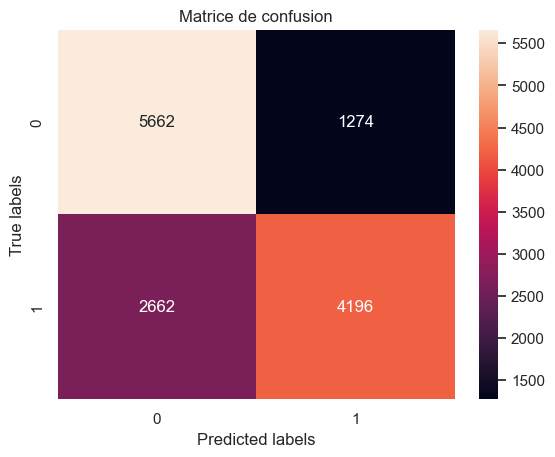

In [ ]:
sns.heatmap(conf_matrix1, annot=True, fmt='d')
plt.title('Matrice de confusion')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
display(conf_matrix1)

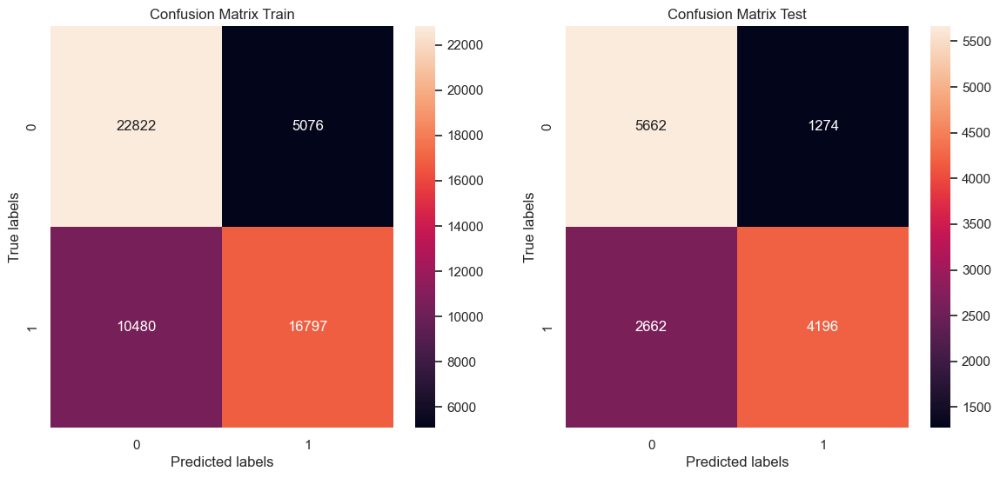

In [ ]:
plt.figure(figsize=(14, 6))
plt.subplot(121)
sns.heatmap(conf_matrix, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Train')
plt.subplot(122)
sns.heatmap(conf_matrix1, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Test')
plt.show()

In [ ]:
TN =conf_matrix1[0][0]
FP = conf_matrix1[0][1]
FN =conf_matrix1[1][0]
TP = conf_matrix1[1][1]

score = TN/(TN+FP)
display(score)

0.816320645905421

In [ ]:
param_grid = {
    'C': [1, 2,3, 5, 7, 10],
    'kernel': ['linear', 'poly', 'rbf', 'sigmoid']
}
svc = SVC()


In [ ]:
# Créer un objet GridSearchCV
grid_search = GridSearchCV(estimator=svc, param_grid=param_grid, cv=5, n_jobs=-1)



In [ ]:
# Effectuer la recherche sur la grille avec les données d'entraînement
grid_search.fit(x_train[:5000], y_train[:5000])

GridSearchCV(cv=5, estimator=SVC(), n_jobs=-1,
             param_grid={'C': [1, 2, 3, 5, 7, 10],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']})

In [ ]:
#Afficher les meilleurs paramètres et le score correspondant
print("Meilleurs paramètres:", grid_search.best_params_)
print("Meilleur score (cross-validation):", grid_search.best_score_)
# Obtenir le modèle avec les meilleurs paramètres
best_svc = grid_search.best_estimator_
# Évaluer le modèle sur les données de test
test_score = best_svc.score(x_test, y_test)
print("Score sur les données de test:", test_score)

Meilleurs paramètres: {'C': 5, 'kernel': 'linear'}
Meilleur score (cross-validation): 0.7227999999999999
Score sur les données de test: 0.7152385094968827


In [ ]:
svc3 = best_svc
svc3.fit(x_train[:1000],y_train[:1000])
display(svc3.score(x_test,y_test))

0.7142960707554009

In [ ]:
svc4 = best_svc
svc4.fit(X_train_pca[:1000],y_train[:1000])
display(svc3.score(x_test,y_test))

In [ ]:
y_pred2 = svc3.predict(x_test)
y_train2 = svc3.predict(x_train)
print(classification_report(y_true=y_test, y_pred=y_pred2))
conf_matrix2 = confusion_matrix(y_true=y_test, y_pred=y_pred2)
conf_matrix3 = confusion_matrix(y_true= y_train, y_pred=y_train2)

              precision    recall  f1-score   support

           0       0.68      0.82      0.74      6936
           1       0.77      0.61      0.68      6858

    accuracy                           0.71     13794
   macro avg       0.72      0.71      0.71     13794
weighted avg       0.72      0.71      0.71     13794



array([[5664, 1272],
       [2669, 4189]], dtype=int64)

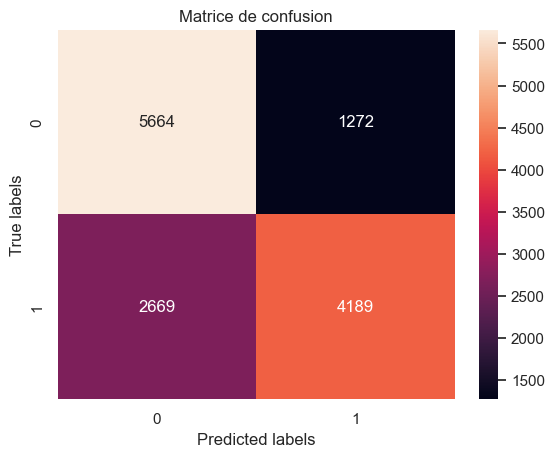

In [ ]:
sns.heatmap(conf_matrix2, annot=True, fmt='d')
plt.title('Matrice de confusion')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
display(conf_matrix2)

In [ ]:
plt.figure(figsize=(14, 6))
plt.subplot(121)
sns.heatmap(conf_matrix2, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Train')
plt.subplot(122)
sns.heatmap(conf_matrix3, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Test')
plt.show()

In [ ]:
TN =conf_matrix2[0][0]
FP = conf_matrix2[0][1]
FN =conf_matrix2[1][0]
TP = conf_matrix2[1][1]

score = TN/(TN+FP)
display(score)

0.8166089965397924

In [ ]:
coefficients = svc3.coef_.ravel()

# Créer un DataFrame pour afficher les variables et leurs importances
feature_importance_df = pd.DataFrame({'Variable': x_train.columns, 'Importance': coefficients})

# Trier le DataFrame par ordre décroissant d'importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False).head(5)

# Afficher le DataFrame avec les importances
print(feature_importance_df)

                                      Variable  Importance
24  Pression_Arterielle_Categorie_Hypertension    1.465155
11                      cholesterol_tres eleve    1.143636
17                      IMC_Categorie_Surpoids    0.104575
12                                  glycemie_1    0.092833
21                         Age_Categorie_36-50    0.062222


# Decision Tree

In [ ]:
model_tree = DecisionTreeClassifier(criterion='entropy', max_depth=8, random_state=861)
model_tree.fit(x_train, y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=8, random_state=861)

In [ ]:
y_pred_tree = model_tree.predict(x_train)
y_pred_tree1 = model_tree.predict(x_test)
cm_tree = pd.crosstab(y_train, y_pred_tree, rownames=['Classe réelle (train)'], colnames=['Classe prédite (train)'], margins=True);
cm_tree1 = pd.crosstab(y_test, y_pred_tree1, rownames=['Classe réelle (train)'], colnames=['Classe prédite (train)'], margins=True);

display(cm_tree)
display(cm_tree1)

Classe prédite (train),0,1,All
Classe réelle (train),,,
0,21157,6741,27898
1,7633,19644,27277
All,28790,26385,55175


Classe prédite (train),0,1,All
Classe réelle (train),,,
0,5154,1782,6936
1,1998,4860,6858
All,7152,6642,13794


In [ ]:
print(classification_report(y_true=y_test, y_pred=y_pred_tree1   ))
conf_matrix1 = confusion_matrix(y_true=y_test, y_pred=y_pred_tree1)
conf_matrix= confusion_matrix(y_true=y_train, y_pred=y_pred_tree)

              precision    recall  f1-score   support

           0       0.72      0.74      0.73      6936
           1       0.73      0.71      0.72      6858

    accuracy                           0.73     13794
   macro avg       0.73      0.73      0.73     13794
weighted avg       0.73      0.73      0.73     13794



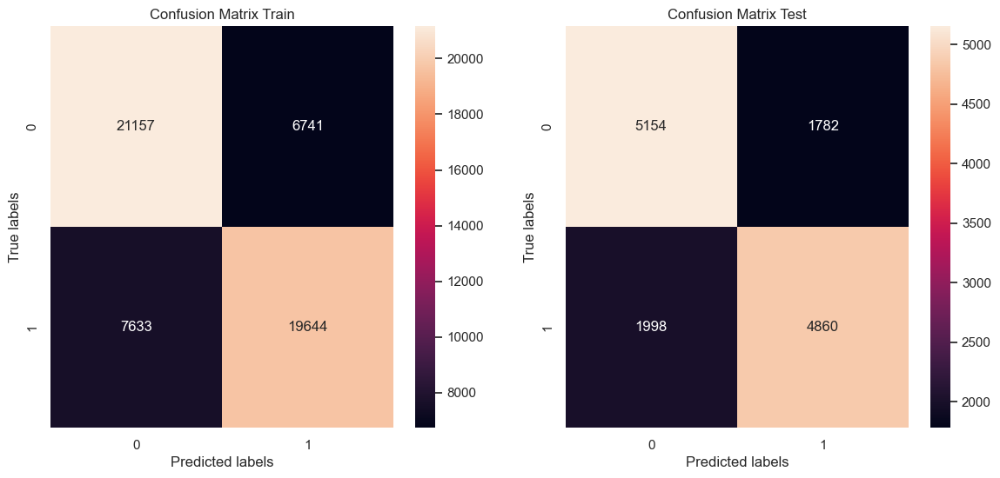

In [ ]:
plt.figure(figsize=(14, 6))
plt.subplot(121)
sns.heatmap(conf_matrix, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Train')
plt.subplot(122)
sns.heatmap(conf_matrix1, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Test')
plt.show()

In [ ]:
TN =conf_matrix1[0][0]
FP = conf_matrix1[0][1]
FN =conf_matrix1[1][0]
TP = conf_matrix1[1][1]

score = TN/(TN+FP)
display(score)

0.7430795847750865

In [ ]:
param_grid = {
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'criterion': ['gini', 'entropy']
}

# Initialisation du classificateur
clf = DecisionTreeClassifier()

In [ ]:
# Création de l'objet GridSearchCV
grid_search = GridSearchCV(clf, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Ajustement du modèle
grid_search.fit(x_train, y_train)


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 10],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10]},
             scoring='accuracy')

In [ ]:
# Affichage des meilleurs paramètres
print("Meilleurs paramètres:", grid_search.best_params_)

# Evaluation des performances sur l'ensemble de test
accuracy = grid_search.best_estimator_.score(x_test, y_test)
print("Accuracy:", accuracy)

Meilleurs paramètres: {'criterion': 'gini', 'max_depth': 5, 'min_samples_leaf': 4, 'min_samples_split': 5}
Accuracy: 0.7259678120922141


In [ ]:
model_tree2 = grid_search.best_estimator_
model_tree2.fit(x_train, y_train)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=4, min_samples_split=5)

In [ ]:
y_pred_tree2 = model_tree2.predict(x_train)
y_pred_tree21 = model_tree2.predict(x_test)
cm_tree2 = pd.crosstab(y_train, y_pred_tree2, rownames=['Classe réelle (train)'], colnames=['Classe prédite (train)'], margins=True);
cm_tree21 = pd.crosstab(y_test, y_pred_tree21, rownames=['Classe réelle (train)'], colnames=['Classe prédite (train)'], margins=True);

display(cm_tree2)
display(cm_tree21)

Classe prédite (train),0,1,All
Classe réelle (train),,,
0,22065,5833,27898
1,8981,18296,27277
All,31046,24129,55175


Classe prédite (train),0,1,All
Classe réelle (train),,,
0,5447,1489,6936
1,2291,4567,6858
All,7738,6056,13794


In [ ]:
print(classification_report(y_true=y_test, y_pred=y_pred_tree21   ))
conf_matrix2 = confusion_matrix(y_true=y_test, y_pred=y_pred_tree21)
conf_matrix3 = confusion_matrix(y_true=y_train, y_pred=y_pred_tree2)

              precision    recall  f1-score   support

           0       0.70      0.79      0.74      6936
           1       0.75      0.67      0.71      6858

    accuracy                           0.73     13794
   macro avg       0.73      0.73      0.72     13794
weighted avg       0.73      0.73      0.72     13794



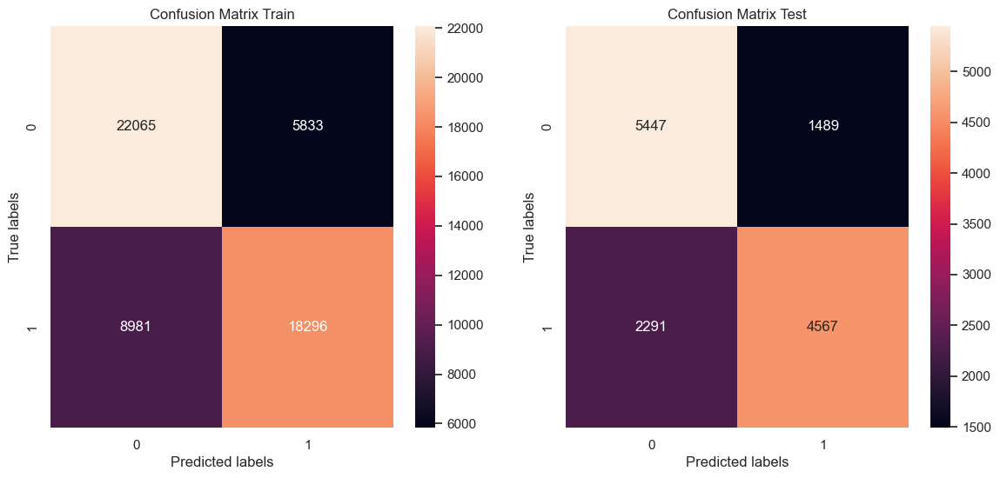

In [ ]:
plt.figure(figsize=(14, 6))
plt.subplot(121)
sns.heatmap(conf_matrix3, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Train')
plt.subplot(122)
sns.heatmap(conf_matrix2, annot=True, fmt='g')
plt.xlabel('Predicted labels')
plt.ylabel('True labels')
plt.title('Confusion Matrix Test')
plt.show()

In [ ]:
TN =conf_matrix2[0][0]
FP = conf_matrix2[0][1]
FN =conf_matrix2[1][0]
TP = conf_matrix2[1][1]

score = TN/(TN+FP)
display(score)

0.785322952710496

In [ ]:
importances = model_tree2.feature_importances_

# Créer un DataFrame pour afficher les variables et leurs importances
feature_importance_df = pd.DataFrame({'Variable': x_train.columns, 'Importance': importances})

# Trier le DataFrame par ordre décroissant d'importance
feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False).head(5)

# Afficher le DataFrame avec les importances
print(feature_importance_df)

                                             Variable  Importance
3                                      pression_systo    0.781398
0                                           Age(year)    0.123830
11                             cholesterol_tres eleve    0.071819
14                                         glycemie_3    0.007231
25  Pression_Arterielle_Categorie_Hypertension Légère    0.004241


# Random Forest

Classe prédite (test),0,1
Classe réelle (test),,
0,5669,1267
1,2532,4326


Classe prédite (test),0,1,All
Classe réelle (test),,,
0,5669,1267,6936
1,2532,4326,6858
All,8201,5593,13794


              precision    recall  f1-score   support

           0       0.69      0.82      0.75      6936
           1       0.77      0.63      0.69      6858

    accuracy                           0.72     13794
   macro avg       0.73      0.72      0.72     13794
weighted avg       0.73      0.72      0.72     13794



5669

4326

1267

2532

0.691257163760517

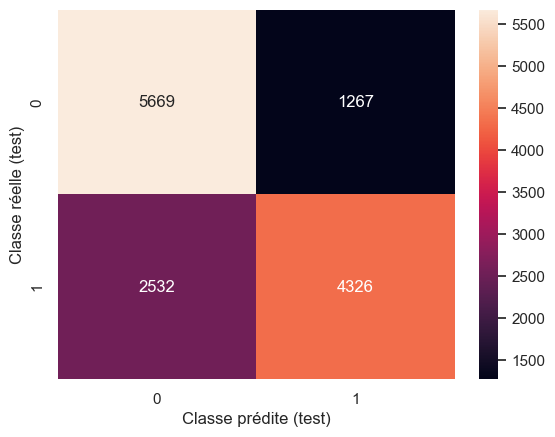

In [ ]:
model_forest = RandomForestClassifier(n_estimators=50, max_depth=5, random_state=311, n_jobs=-1, verbose=0)
model_forest.fit(x_train, y_train)

y_pred_forest = model_forest.predict(x_test)
cm_forest = pd.crosstab(y_test, y_pred_forest, rownames=['Classe réelle (test)'], colnames=['Classe prédite (test)'], margins=True)
cm_forest_graph = pd.crosstab(y_test, y_pred_forest, rownames=['Classe réelle (test)'], colnames=['Classe prédite (test)'], margins=False)
sns.heatmap(cm_forest_graph, annot=True, fmt='.4g')
display(cm_forest_graph)
display(cm_forest)
class_names = list(map(str, model_forest.classes_))
report_forest = classification_report(y_true=y_test, y_pred=y_pred_forest)
print(report_forest)

TN =cm_forest[0][0]
FP = cm_forest[0][1]
FN =cm_forest[1][0]
TP = cm_forest[1][1]
 
display(TN)
display(TP)
display(FN)
display(FP)
 
score = TN/(TN+FP)

display(score)

In [ ]:
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7, 10],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'criterion': ['entropy', 'gini'],
    'bootstrap': [False, True]
}

# Initialisation du classificateur
clf_forest = RandomForestClassifier(random_state=311, n_jobs=-1, verbose=0)

In [ ]:
# Création de l'objet GridSearchCV
grid_search_forest = GridSearchCV(clf_forest, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

In [ ]:
# Ajustement du modèle
grid_search_forest.fit(x_train, y_train)

KeyboardInterrupt: 

In [ ]:
# Affichage des meilleurs paramètres
print("Meilleurs paramètres:", grid_search_forest.best_params_)

Meilleurs paramètres: {'bootstrap': False, 'criterion': 'entropy', 'max_depth': 10, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}


In [ ]:
# Prédiction sur l'ensemble de test avec le meilleur modèle
y_pred_forest_grid = grid_search_forest.best_estimator_.predict(x_test)

# Matrice de confusion
cm_forest_grid = pd.crosstab(y_test, y_pred_forest_grid, rownames=['Classe réelle (test)'], colnames=['Classe prédite (test)'], margins=True)
cm_forest_grid_graph = pd.crosstab(y_test, y_pred_forest_grid, rownames=['Classe réelle (test)'], colnames=['Classe prédite (test)'], margins=False)
display(cm_forest_grid)

# Rapport de classification
report_forest_grid = classification_report(y_true=y_test, y_pred=y_pred_forest_grid)
print(report_forest_grid)

Classe prédite (test),0,1,All
Classe réelle (test),,,
0,5486,1460,6946
1,2198,4607,6805
All,7684,6067,13751


              precision    recall  f1-score   support

           0       0.71      0.79      0.75      6946
           1       0.76      0.68      0.72      6805

    accuracy                           0.73     13751
   macro avg       0.74      0.73      0.73     13751
weighted avg       0.74      0.73      0.73     13751



5486

4607

1460

2198

0.7139510671525248

Classe prédite (test),0,1
Classe réelle (test),,
0,5486,1460
1,2198,4607


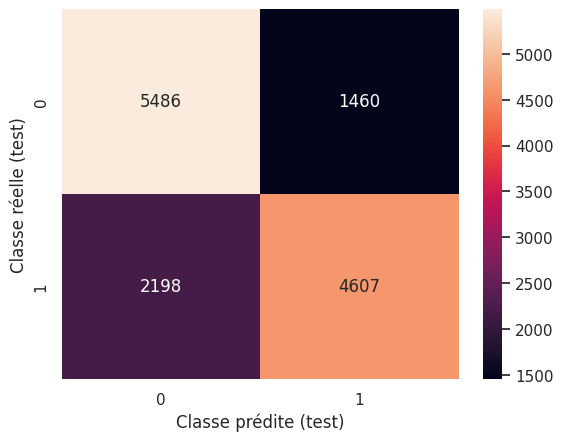

In [ ]:
#calcul de la précision
TN =cm_forest_grid[0][0]
FP = cm_forest_grid[0][1]
FN =cm_forest_grid[1][0]
TP = cm_forest_grid[1][1]
 
display(TN)
display(TP)
display(FN)
display(FP)
 
score = TN/(TN+FP)
display(score)

sns.heatmap(cm_forest_grid_graph, annot=True, fmt='.4g')
display(cm_forest_grid_graph)